<center> <img src = https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/hh%20label.jpg alt="drawing" style="width:400px;">

# <center> Проект: Анализ резюме из HeadHunter
   

In [99]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import statsmodels.api as sm


# Исследование структуры данных

1. Прочитайте данные с помощью библиотеки Pandas. Совет: перед чтением обратите внимание на разделитель внутри файла. 

In [100]:
hh_data = pd.read_csv("dst-3.0_16_1_hh_database.csv", sep=";")

In [101]:
print(hh_data.shape) 

(44744, 12)


2. Выведите несколько первых (последних) строк таблицы, чтобы убедиться в том, что ваши данные не повреждены. Ознакомьтесь с признаками и их структурой.

In [102]:
display(hh_data.head())

display(hh_data.tail())

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
0,"Мужчина , 39 лет , родился 27 ноября 1979",29000 руб.,Системный администратор,"Советск (Калининградская область) , не готов к...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, ва...",Опыт работы 16 лет 10 месяцев Август 2010 — п...,"МАОУ ""СОШ № 1 г.Немана""",Системный администратор,Неоконченное высшее образование 2000 Балтийск...,16.04.2019 15:59,Имеется собственный автомобиль
1,"Мужчина , 60 лет , родился 20 марта 1959",40000 руб.,Технический писатель,"Королев , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, полный день, сменный график, уд...",Опыт работы 19 лет 5 месяцев Январь 2000 — по...,Временный трудовой коллектив,"Менеджер проекта, Аналитик, Технический писатель",Высшее образование 1981 Военно-космическая ак...,12.04.2019 08:42,Не указано
2,"Женщина , 36 лет , родилась 12 августа 1982",20000 руб.,Оператор,"Тверь , не готова к переезду , не готова к ком...",полная занятость,полный день,Опыт работы 10 лет 3 месяца Октябрь 2004 — Де...,ПАО Сбербанк,Кассир-операционист,Среднее специальное образование 2002 Профессио...,16.04.2019 08:35,Не указано
3,"Мужчина , 38 лет , родился 25 июня 1980",100000 руб.,Веб-разработчик (HTML / CSS / JS / PHP / базы ...,"Саратов , не готов к переезду , готов к редким...","частичная занятость, проектная работа, полная ...","гибкий график, удаленная работа",Опыт работы 18 лет 9 месяцев Август 2017 — Ап...,OpenSoft,Инженер-программист,Высшее образование 2002 Саратовский государст...,08.04.2019 14:23,Не указано
4,"Женщина , 26 лет , родилась 3 марта 1993",140000 руб.,Региональный менеджер по продажам,"Москва , не готова к переезду , готова к коман...",полная занятость,полный день,Опыт работы 5 лет 7 месяцев Региональный мене...,Мармелад,Менеджер по продажам,Высшее образование 2015 Кгу Психологии и педаг...,22.04.2019 10:32,Не указано


,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
44739,"Мужчина , 30 лет , родился 17 января 1989",50000 руб.,"Финансист, аналитик, экономист, бухгалтер, мен...","Тверь , готов к переезду (Москва, Химки) , гот...",полная занятость,"полный день, удаленная работа","Опыт работы 7 лет 7 месяцев Финансист, аналит...","ООО ""IAS"" (независимый участник объединения Ru...",Руководитель субгруппы,Высшее образование 2015 Московский гуманитарн...,22.04.2019 12:32,Не указано
44740,"Мужчина , 27 лет , родился 5 марта 1992",39000 руб.,"Системный администратор, IT-специалист","Липецк , готов к переезду , готов к командировкам","проектная работа, частичная занятость, полная ...","удаленная работа, гибкий график, полный день, ...","Опыт работы 7 лет Системный администратор, IT...",ИП Пестрецов,Предприниматель,Высшее образование (Бакалавр) 2016 Воронежски...,22.04.2019 13:11,Не указано
44741,"Женщина , 48 лет , родилась 26 декабря 1970",40000 руб.,"Аналитик данных, Математик","Челябинск , готова к переезду , готова к редки...",полная занятость,"полный день, удаленная работа",Опыт работы 21 год 5 месяцев Январь 1998 — по...,"ОАО «ЧМК», Исследовательско-Технологический Це...",Начальник группы аналитики,Высшее образование 2000 Южно-Уральский госуда...,09.04.2019 05:07,Не указано
44742,"Мужчина , 24 года , родился 6 октября 1994",20000 руб.,Контент-менеджер,"Тамбов , не готов к переезду , не готов к кома...","частичная занятость, полная занятость",удаленная работа,Опыт работы 3 года 10 месяцев Контент-менедже...,IQ-Maxima,Менеджер проектов,Высшее образование 2015 Тамбовский государств...,26.04.2019 14:25,Имеется собственный автомобиль
44743,"Мужчина , 38 лет , родился 25 апреля 1980",120000 руб.,Руководитель проекта,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 15 лет 10 месяцев Руководитель пр...,ПАО ГК ТНС энерго,Руководитель отдела технической поддержки,Высшее образование 1997 Южно-Российский госуд...,05.07.2018 20:15,Не указано


3. Выведите основную информацию о числе непустых значений в столбцах и их типах в таблице.

4. Обратите внимание на информацию о числе непустых значений.

In [103]:
display(hh_data.info())

display(hh_data.isna().sum())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 44744 entries, 0 to 44743
Data columns (total 12 columns):
 #   Column                           Non-Null Count  Dtype 
---  ------                           --------------  ----- 
 0   Пол, возраст                     44744 non-null  object
 1   ЗП                               44744 non-null  object
 2   Ищет работу на должность:        44744 non-null  object
 3   Город, переезд, командировки     44744 non-null  object
 4   Занятость                        44744 non-null  object
 5   График                           44744 non-null  object
 6   Опыт работы                      44576 non-null  object
 7   Последнее/нынешнее место работы  44743 non-null  object
 8   Последняя/нынешняя должность     44742 non-null  object
 9   Образование и ВУЗ                44744 non-null  object
 10  Обновление резюме                44744 non-null  object
 11  Авто                             44744 non-null  object
dtypes: object(12)
memory usage: 4.1+

None

Пол, возраст                         0
ЗП                                   0
Ищет работу на должность:            0
Город, переезд, командировки         0
Занятость                            0
График                               0
Опыт работы                        168
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Образование и ВУЗ                    0
Обновление резюме                    0
Авто                                 0
dtype: int64

5. Выведите основную статистическую информацию о столбцах.


In [104]:
display(hh_data.describe(include=["object"]))

,"Пол, возраст",ЗП,Ищет работу на должность:,"Город, переезд, командировки",Занятость,График,Опыт работы,Последнее/нынешнее место работы,Последняя/нынешняя должность,Образование и ВУЗ,Обновление резюме,Авто
count,44744,44744,44744,44744,44744,44744,44576,44743,44742,44744,44744,44744
unique,16003,690,14929,10063,38,47,44413,30214,16927,40148,18838,2
top,"Мужчина , 32 года , родился 17 сентября 1986",50000 руб.,Системный администратор,"Москва , не готов к переезду , не готов к кома...",полная занятость,полный день,Опыт работы 10 лет 8 месяцев Апрель 2018 — по...,Индивидуальное предпринимательство / частная п...,Системный администратор,Высшее образование 1987 Военный инженерный Кра...,07.05.2019 09:50,Не указано
freq,18,4064,3099,1261,30026,22727,3,935,2062,4,25,32268


# Преобразование данных

1. Начнем с простого - с признака **"Образование и ВУЗ"**. Его текущий формат это: **<Уровень образования год выпуска ВУЗ специальность...>**. Например:
* Высшее образование 2016 Московский авиационный институт (национальный исследовательский университет)...
* Неоконченное высшее образование 2000  Балтийская государственная академия рыбопромыслового флота…
Нас будет интересовать только уровень образования.

Создайте с помощью функции-преобразования новый признак **"Образование"**, который должен иметь 4 категории: "высшее", "неоконченное высшее", "среднее специальное" и "среднее".

Выполните преобразование, ответьте на контрольные вопросы и удалите признак "Образование и ВУЗ".

Совет: обратите внимание на структуру текста в столбце **"Образование и ВУЗ"**. Гарантируется, что текущий уровень образования соискателя всегда находится в первых 2ух слов и начинается с заглавной буквы. Воспользуйтесь этим.

*Совет: проверяйте полученные категории, например, с помощью метода unique()*


In [105]:
def parse_education(edu_string):
    edu_string = edu_string.split(" ")[:3]
    edu_string = " ".join(edu_string)
    for i in ["Высшее", "Неоконченное высшее", "Среднее специальное", "Среднее"]:
        if i in edu_string:
            return i.lower()
hh_data["Образование"] = hh_data["Образование и ВУЗ"].apply(parse_education)
hh_data = hh_data.drop("Образование и ВУЗ", axis=1)
display(hh_data["Образование"].value_counts()["среднее"])

559

2. Теперь нас интересует столбец **"Пол, возраст"**. Сейчас он представлен в формате **<Пол , возраст , дата рождения >**. Например:
* Мужчина , 39 лет , родился 27 ноября 1979 
* Женщина , 21 год , родилась 13 января 2000
Как вы понимаете, нам необходимо выделить каждый параметр в отдельный столбец.

Создайте два новых признака **"Пол"** и **"Возраст"**. При этом важно учесть:
* Признак пола должен иметь 2 уникальных строковых значения: 'М' - мужчина, 'Ж' - женщина. 
* Признак возраста должен быть представлен целыми числами.

Выполните преобразование, ответьте на контрольные вопросы и удалите признак **"Пол, возраст"** из таблицы.

*Совет: обратите внимание на структуру текста в столбце, в части на то, как разделены параметры пола, возраста и даты рождения между собой - символом ' , '. 
Гарантируется, что структура одинакова для всех строк в таблице. Вы можете воспользоваться этим.*


In [106]:
def parse_gender(male_female):
    if "Женщина" in male_female:
        return "Ж"
    else:
        return "М"
def parse_age(string):
    age = int(string.split(" ")[3])
    return age


hh_data['Пол'] = hh_data['Пол, возраст'].apply(parse_gender)
hh_data['Возраст'] = hh_data['Пол, возраст'].apply(parse_age)
hh_data = hh_data.drop('Пол, возраст', axis=1)

print(round(hh_data['Пол'].value_counts(normalize=True)['Ж'] * 100, 2))
print(round(hh_data['Возраст'].mean(), 2))

19.07
32.2


3. Следующим этапом преобразуем признак **"Опыт работы"**. Его текущий формат - это: **<Опыт работы: n лет m месяцев, периоды работы в различных компаниях…>**. 

Из столбца нам необходимо выделить общий опыт работы соискателя в месяцах, новый признак назовем "Опыт работы (месяц)"

Для начала обсудим условия решения задачи:
* Во-первых, в данном признаке есть пропуски. Условимся, что если мы встречаем пропуск, оставляем его как есть (функция-преобразование возвращает NaN)
* Во-вторых, в данном признаке есть скрытые пропуски. Для некоторых соискателей в столбце стоит значения "Не указано". Их тоже обозначим как NaN (функция-преобразование возвращает NaN)
* В-третьих, нас не интересует информация, которая описывается после указания опыта работы (периоды работы в различных компаниях)
* В-четвертых, у нас есть проблема: опыт работы может быть представлен только в годах или только месяцах. Например, можно встретить следующие варианты:
    * Опыт работы 3 года 2 месяца…
    * Опыт работы 4 года…
    * Опыт работы 11 месяцев…
    * Учитывайте эту особенность в вашем коде

Учитывайте эту особенность в вашем коде

В результате преобразования у вас должен получиться столбец, содержащий информацию о том, сколько месяцев проработал соискатель.
Выполните преобразование, ответьте на контрольные вопросы и удалите столбец **"Опыт работы"** из таблицы.


In [107]:
def parse_experience(string):
    if string is np.nan or string == "Не указано":
        return None
    string_splitted = string.split(" ")[:7]
    exp = {"years": 0, "months": 0}
    for index, word in enumerate(string_splitted):
        if word in ["год", "года", "лет"]:
            exp["years"] = int(string_splitted[index-1])
        if word in ["месяц", "месяца", "месяцев"]:
            exp["months"] = int(string_splitted[index-1])
    return int(exp["years"] * 12 + exp["months"])

hh_data["Опыт работы (месяц)"] = hh_data["Опыт работы"].apply(parse_experience)
hh_data = hh_data.drop("Опыт работы", axis=1)

round(hh_data["Опыт работы (месяц)"].median())

100

4. Хорошо идем! Следующий на очереди признак "Город, переезд, командировки". Информация в нем представлена в следующем виде: **<Город , (метро) , готовность к переезду (города для переезда) , готовность к командировкам>**. В скобках указаны необязательные параметры строки. Например, можно встретить следующие варианты:

* Москва , не готов к переезду , готов к командировкам
* Москва , м. Беломорская , не готов к переезду, не готов к командировкам
* Воронеж , готов к переезду (Сочи, Москва, Санкт-Петербург) , готов к командировкам

Создадим отдельные признаки **"Город"**, **"Готовность к переезду"**, **"Готовность к командировкам"**. При этом важно учесть:

* Признак **"Город"** должен содержать только 4 категории: "Москва", "Санкт-Петербург" и "город-миллионник" (их список ниже), остальные обозначьте как "другие".

    Список городов-миллионников:
    
   <code>million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    </code>
    Инфорация о метро, рядом с которым проживает соискатель нас не интересует.
* Признак **"Готовность к переезду"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к переезду в признаке "Город, переезд, командировки". Например:
    * … , готов к переезду , …
    * … , не готова к переезду , …
    * … , готова к переезду (Москва, Санкт-Петербург, Ростов-на-Дону)
    * … , хочу переехать (США) , …
    
    Нас интересует только сам факт возможности или желания переезда.
* Признак **"Готовность к командировкам"** должен иметь два возможных варианта: True или False. Обратите внимание, что возможны несколько вариантов описания готовности к командировкам в признаке "Город, переезд, командировки". Например:
    * … , готов к командировкам , … 
    * … , готова к редким командировкам , …
    * … , не готов к командировкам , …
    
    Нас интересует только сам факт готовности к командировке.
    
    Еще один важный факт: при выгрузки данных у некоторых соискателей "потерялась" информация о готовности к командировкам. Давайте по умолчанию будем считать, что такие соискатели не готовы к командировкам.
    
Выполните преобразования и удалите столбец **"Город, переезд, командировки"** из таблицы.

*Совет: обратите внимание на то, что структура текста может меняться в зависимости от указания ближайшего метро. Учите это, если будете использовать порядок слов в своей программе.*


In [108]:
def parse_city(string):
    capital_cities = ["Москва", "Санкт-Петербург"]
    million_cities = ['Новосибирск', 'Екатеринбург','Нижний Новгород','Казань', 'Челябинск','Омск', 'Самара', 'Ростов-на-Дону', 'Уфа', 'Красноярск', 'Пермь', 'Воронеж','Волгоград']
    city = string.split(" , ")[0]
    if city in capital_cities:
        return city;
    elif city in million_cities:
        return "город миллионник"
    else:
        return "другие"

def parse_relocation(string):
    return "не готов к переезду" not in string and "не готова к переезду" not in string

def parse_business_trips(string):
    return ("командировка" in string) and ("не готов к командировкам" not in string) and ("не готова к командировкам" not in string)

hh_data["Город"] = hh_data["Город, переезд, командировки"].apply(parse_city)
hh_data["Готовность к переезду"] = hh_data["Город, переезд, командировки"].apply(parse_relocation)
hh_data["Готовность к командировкам"] = hh_data["Город, переезд, командировки"].apply(parse_business_trips)
hh_data = hh_data.drop("Город, переезд, командировки", axis=1)

print(round(hh_data["Город"].value_counts(normalize=True)["Санкт-Петербург"] * 100))
print(round(hh_data[hh_data["Готовность к переезду"] & hh_data["Готовность к командировкам"]].shape[0] / hh_data.shape[0] * 100))

11
32


5. Рассмотрим поближе признаки **"Занятость"** и **"График"**. Сейчас признаки представляют собой набор категорий желаемой занятости (полная занятость, частичная занятость, проектная работа, волонтерство, стажировка) и желаемого графика работы (полный день, сменный график, гибкий график, удаленная работа, вахтовый метод).
На сайте hh.ru соискатель может указывать различные комбинации данных категорий, например:
* полная занятость, частичная занятость
* частичная занятость, проектная работа, волонтерство
* полный день, удаленная работа
* вахтовый метод, гибкий график, удаленная работа, полная занятость

Такой вариант признаков имеет множество различных комбинаций, а значит множество уникальных значений, что мешает анализу. Нужно это исправить!

Давайте создадим признаки-мигалки для каждой категории: если категория присутствует в списке желаемых соискателем, то в столбце на месте строки рассматриваемого соискателя ставится True, иначе - False.

Такой метод преобразования категориальных признаков называется One Hot Encoding и его схема представлена на рисунке ниже:
<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/ohe.jpg>
Выполните данное преобразование для признаков "Занятость" и "График", ответьте на контрольные вопросы, после чего удалите их из таблицы

In [109]:
for type1 in ["полная занятость", "частичная занятость", "проектная работа", "волонтерство", "стажировка"]:
    hh_data[type1] = hh_data["Занятость"].apply(lambda string: type1 in string)
for type2 in ["полный день", "сменный график", "гибкий график", "удалённая работа", "вахтовый метод"]:
    hh_data[type2] = hh_data["График"].apply(lambda string: type2 in string)
hh_data = hh_data.drop(["Занятость", "График"], axis=1)
print(hh_data[hh_data["проектная работа"] & hh_data["волонтерство"]].shape[0])
print(hh_data[hh_data["вахтовый метод"] & hh_data["гибкий график"]].shape[0])


436
2311


6. (2 балла) Наконец, мы добрались до самого главного и самого важного - признака заработной платы **"ЗП"**. 
В чем наша беда? В том, что помимо желаемой заработной платы соискатель указывает валюту, в которой он бы хотел ее получать, например:
* 30000 руб.
* 50000 грн.
* 550 USD

Нам бы хотелось видеть заработную плату в единой валюте, например, в рублях. Возникает вопрос, а где взять курс валют по отношению к рублю?

На самом деле язык Python имеет в арсенале огромное количество возможностей получения данной информации, от обращения к API Центробанка, до использования специальных библиотек, например pycbrf. Однако, это не тема нашего проекта.

Поэтому мы пойдем в лоб: обратимся к специальным интернет-ресурсам для получения данных о курсе в виде текстовых файлов. Например, MDF.RU, данный ресурс позволяет удобно экспортировать данные о курсах различных валют и акций за указанные периоды в виде csv файлов. Мы уже сделали выгрузку курсов валют, которые встречаются в наших данных за период с 29.12.2017 по 05.12.2019. Скачать ее вы можете **на платформе**

Создайте новый DataFrame из полученного файла. В полученной таблице нас будут интересовать столбцы:
* "currency" - наименование валюты в ISO кодировке,
* "date" - дата, 
* "proportion" - пропорция, 
* "close" - цена закрытия (последний зафиксированный курс валюты на указанный день).


Перед вами таблица соответствия наименований иностранных валют в наших данных и их общепринятых сокращений, которые представлены в нашем файле с курсами валют. Пропорция - это число, за сколько единиц валюты указан курс в таблице с курсами. Например, для казахстанского тенге курс на 20.08.2019 составляет 17.197 руб. за 100 тенге, тогда итоговый курс равен - 17.197 / 100 = 0.17197 руб за 1 тенге.
Воспользуйтесь этой информацией в ваших преобразованиях.

<img src=https://raw.githubusercontent.com/AndreyRysistov/DatasetsForPandas/main/table.jpg>


Осталось только понять, откуда брать дату, по которой определяется курс? А вот же она - в признаке **"Обновление резюме"**, в нем содержится дата и время, когда соискатель выложил текущий вариант своего резюме. Нас интересует только дата, по ней бы и будем сопоставлять курсы валют.

Теперь у нас есть вся необходимая информация для того, чтобы создать признак "ЗП (руб)" - заработная плата в рублях.

После ответа на контрольные вопросы удалите исходный столбец заработной платы "ЗП" и все промежуточные столбцы, если вы их создавали.

Итак, давайте обсудим возможный алгоритм преобразования: 
1. Перевести признак "Обновление резюме" из таблицы с резюме в формат datetime и достать из него дату. В тот же формат привести признак "date" из таблицы с валютами.
2. Выделить из столбца "ЗП" сумму желаемой заработной платы и наименование валюты, в которой она исчисляется. Наименование валюты перевести в стандарт ISO согласно с таблицей выше.
3. Присоединить к таблице с резюме таблицу с курсами по столбцам с датой и названием валюты (подумайте, какой тип объединения надо выбрать, чтобы в таблице с резюме сохранились данные о заработной плате, изначально представленной в рублях). Значение close для рубля заполнить единицей 1 (курс рубля самого к себе)
4. Умножить сумму желаемой заработной платы на присоединенный курс валюты (close) и разделить на пропорцию (обратите внимание на пропуски после объединения в этих столбцах), результат занести в новый столбец "ЗП (руб)".


In [110]:
def salary_quantity(salary):
    return float(salary.split()[0])

currency_dict = {'KZT': 'KZT', 'руб.': 'RUB','грн.': 'UAH','бел.руб.': 'BYN',
                 'KGS': 'KGS', 'сум': 'UZS', 'AZN': 'AZN', 'USD': 'USD', 'EUR': 'EUR'}

def salary_currency(salary_str):
    currency_str = salary_str.split(' ')[1]
    return currency_dict[currency_str]


rates = pd.read_csv('ExchangeRates.csv')
rates['date'] = pd.to_datetime(rates['date']).dt.date

hh_data['Обновление резюме'] = pd.to_datetime(hh_data['Обновление резюме']).dt.date

hh_data['ЗП (num)'] = hh_data['ЗП'].apply(salary_quantity)
hh_data['ЗП (currency)'] = hh_data['ЗП'].apply(salary_currency)

merged = hh_data.merge(rates, left_on=['ЗП (currency)', 'Обновление резюме'], right_on=['currency', 'date'], how='left')
merged['close'] = merged['close'].fillna(1)
merged['proportion'] = merged['proportion'].fillna(1)

hh_data['ЗП (руб)'] = merged['close'] * merged['ЗП (num)'] / merged['proportion']

hh_data = hh_data.drop(['ЗП', 'ЗП (num)', 'ЗП (currency)'], axis=1)

print(round(hh_data['ЗП (руб)'].median()/1000))


59


# Исследование зависимостей в данных

1. Постройте распределение признака **"Возраст"**. Опишите распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится возраст большинства соискателей? Есть ли аномалии для признака возраста, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [111]:
# Построение гистограммы
fig = px.histogram(hh_data, x='Возраст', nbins=300)
fig.update_layout(title='Распределение признака "Возраст"', xaxis_title='Возраст', yaxis_title='Количество соискателей')
fig.show()

# Построение коробчатой диаграммы
fig = go.Figure()
fig.add_trace(go.Box(y=hh_data['Возраст'], name='Возраст'))
fig.update_layout(title='Распределение признака "Возраст"')
fig.show()




![Распределение признака "Возраст"](https://mega.nz/file/QMVUzC7Z#1c1X4l4WQEhSAF4joKh9fy26QdWFtK5xVAlBg2jNiOY)

![Распределение признака "Возраст"](https://mega.nz/file/BBlEGQ5B#9TSo-N_tuovMRkhtKlPN3nvRcSAzesxjAxsxL3_h2v4)

Распределение возраста является скошенным вправо, что означает, что большинство соискателей находятся в возрасте от 27 до 36 лет. Мода распределения равна 30 годам.

Предельные значения признака возраста: минимальное значение - 14 лет, максимальное значение - 100 лет.

В данных есть несколько аномальных значений для признака возраста, например, возраст 100 лет. Очевидно, что такие значения являются ошибочными и скорее всего были допущены при заполнении данных. Но значение в 14 лет не должно быть аномалией, поскольку подросток может выполнять некоторые виды труда с этого возраста.

2. Постройте распределение признака **"Опыт работы (месяц)"**. Опишите данное распределение, отвечая на следующие вопросы: чему равна мода распределения, каковы предельные значения признака, в каком примерном интервале находится опыт работы большинства соискателей? Есть ли аномалии для признака опыта работы, какие значения вы бы причислили к их числу?
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*

In [112]:
# распределение опыта работы
exp_dist = hh_data['Опыт работы (месяц)']

# построение гистограммы и коробчатой диаграммы
fig = px.histogram(exp_dist, nbins=300)
fig.update_layout(title='Распределение опыта работы', xaxis_title='Опыт работы (месяц)', yaxis_title='Количество соискателей')
fig.add_trace(px.box(exp_dist, title='Опыт работы')['data'][0])
fig.show()

fig = px.box(hh_data, y='Опыт работы (месяц)')
fig.show()


![Распределение опыта работы"](https://mega.nz/file/IVURDZpA#1pSWlxIolLB8f8sI28a2jCQwkgHbJh1DLwwl_Ox4IJE)
![Распределение опыта работы"](https://mega.nz/file/dAcR3YxC#8jFSDmplv54FS8bkGgJDYq1hcKP78Y1Oto8TRNvdtX8)

На основании анализа распределения опыта работы соискателей мы получили следующие результаты:

Мода распределения опыта работы: от 80 до 84 месяцев (в среднем 7 лет).

Предельные значения признака: 1 месяц и 1188 месяцев (99 лет).

Интервал, в котором находится опыт работы большинства соискателей: от 57 месяцев (4 года и 9 месяцев) до 154 месяцев (12 лет и 10 месяцев).

Была выявлена одна аномалия с опытом работы 1188 месяцев, что равно 99 годам. Это значение явно является ошибкой в данных, так как человек не может иметь опыт работы в 99 лет. Также, возможно, стоит обратить внимание на значения, превышающие, примерно, 600 месяцев (50 лет) и считать их потенциальными аномалиями, так как такой опыт работы в одной компании или на одной должности не является обычным.

Для визуализации распределения опыта работы были построены гистограмма и коробчатая диаграмма, которые позволяют увидеть основные характеристики распределения и выбросы.

3. Постройте распределение признака **"ЗП (руб)"**. Опишите данное распределение, отвечая на следующие вопросы: каковы предельные значения признака, в каком примерном интервале находится заработная плата большинства соискателей? Есть ли аномалии для признака возраста? Обратите внимание на гигантские размеры желаемой заработной платы.
*Совет: постройте гистограмму и коробчатую диаграмму рядом.*


In [113]:

fig = px.histogram(hh_data, x="ЗП (руб)", width=10000, histnorm='percent', marginal="box")
fig.update_layout(
    title='Распределение желаемой зарплаты',
    yaxis_title='Проценты'
)
fig.show()


![Распределение желаемой зарплаты](https://mega.nz/file/8FcDRQaS#7MD9SJDF-qOCnF1ieR3TxuXiN0fvEYA0mQKDeddgz88)


In [114]:
# построение графика зависимости зарплаты от возраста
fig = px.scatter(hh_data, x='Возраст', y='ЗП (руб)', trendline='ols', 
                 labels={'Возраст': 'Возраст, лет', 'ЗП (руб)': 'Зарплата, руб.'})

# определение максимального значения зарплаты
max_salary = hh_data['ЗП (руб)'].max()

# определение количества соискателей с заработной платой выше 1 миллиона рублей
count_high_salary = len(hh_data.loc[hh_data['ЗП (руб)'] > 1_000_000])

# вывод результатов
print(f'Максимальная зарплата: {max_salary:.2f} руб.')
print(f'Количество соискателей с зарплатой выше 1 млн. руб.: {count_high_salary}')

# зависимость зарплаты от возраста

fig = px.scatter(hh_data, x="Возраст", y="ЗП (руб)", trendline="ols")
fig.show()



Максимальная зарплата: 24304876.00 руб.
Количество соискателей с зарплатой выше 1 млн. руб.: 5


![Соотношение возраста к зарплате](https://mega.nz/file/hY8kALiQ#IUYmYDDVkmsUsKlXK6478thfhMOX-6VkiRkKkjVzEnk)

Заработная плата большинства соискателей находится в интервале от 37 до 95 тысяч рублей. На дополнительном графике показана зависимость зарплаты от возраста. Все пять соискателей, которые требуют заработную плату выше 1 миллиона рублей, в том числе соискатель с максимальной зарплатой из выборки в 24304876.00 руб., находятся в возрасте от 24 до 39 лет. Двое из этого списка до 30 лет и трое до 40 лет. Эти же значения являются аномальными, значительно искажающими распределения.

4. Постройте диаграмму, которая показывает зависимость **медианной** желаемой заработной платы (**"ЗП (руб)"**) от уровня образования (**"Образование"**). Используйте для диаграммы данные о резюме, где желаемая заработная плата меньше 1 млн рублей.
*Сделайте выводы по представленной диаграмме: для каких уровней образования наблюдаются наибольшие и наименьшие уровни желаемой заработной платы? Как вы считаете, важен ли признак уровня образования при прогнозировании заработной платы?*

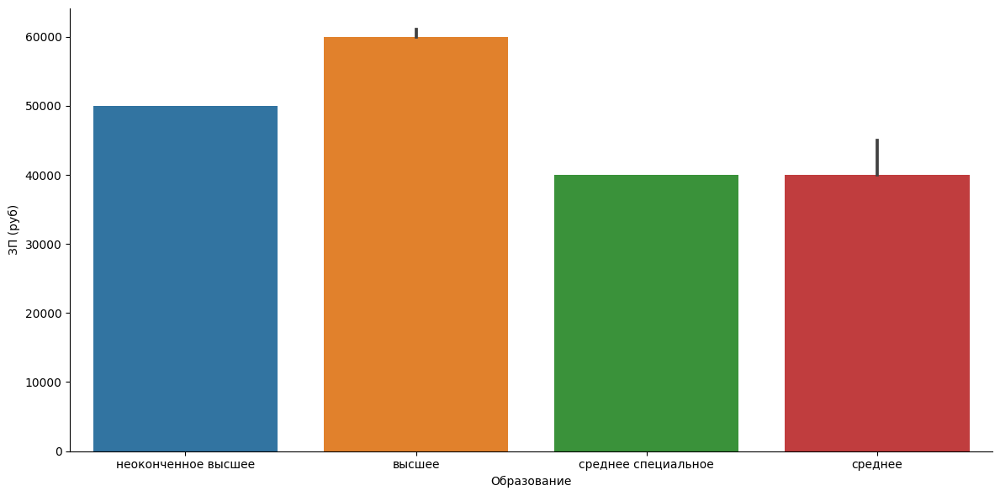

In [115]:
df = hh_data[hh_data['ЗП (руб)'] < 1000000]
sns.catplot(x='Образование', y='ЗП (руб)', kind='bar', data=df, estimator=np.median, height=6, aspect=2)



Исходя из данной диаграммы, можно сделать следующие выводы:

Наибольший уровень желаемой заработной платы наблюдается у соискателей с высшим образованием,  чуть менее востребованы соискатели с неоконченным высшим образованием. Соискатели с неполным средним и средним образованием оказываются в примерно одинаковом положении по уровню желаемой заработной платы и имеют низкие ожидания по заработной плате.

Высшее образование является категорией образования, которая оплачивается выше всех по медианному показателю.
В целом, эти результаты подтверждают значимость образования в процессе трудоустройства и заработной платы, и показывают, что люди с высшим образованием имеют более высокие уровни желаемой заработной платы.

Признак уровня образования является важным при прогнозировании заработной платы, потому что он может быть сильным индикатором профессиональной подготовки. Некоторые профессии требуют определенного уровня образования, чтобы получать определенную зарплату. 

5. Постройте диаграмму, которая показывает распределение желаемой заработной платы (**"ЗП (руб)"**) в зависимости от города (**"Город"**). Используйте для диаграммы данные о резюме, где желая заработная плата меньше 1 млн рублей.
*Сделайте выводы по полученной диаграмме: как соотносятся медианные уровни желаемой заработной платы и их размах в городах? Как вы считаете, важен ли признак города при прогнозировании заработной платы?*

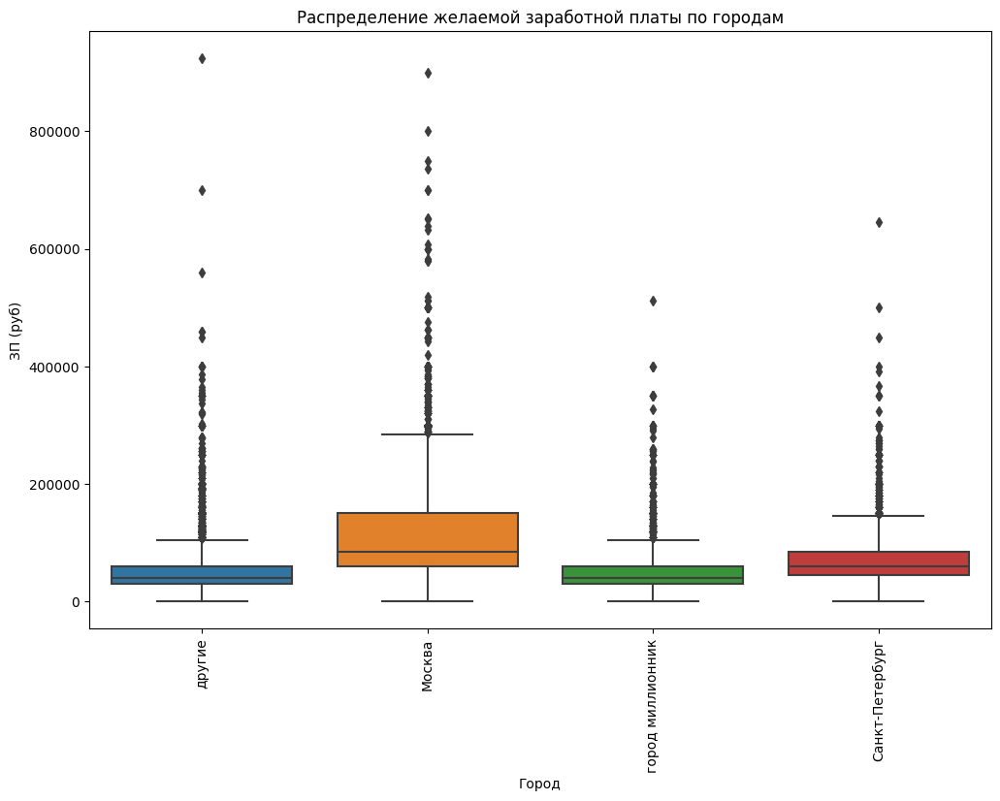

In [116]:
plt.figure(figsize=(12,8))
sns.boxplot(x="Город", y="ЗП (руб)", data=hh_data[hh_data['ЗП (руб)']<1000000])
plt.xticks(rotation=90)
plt.title('Распределение желаемой заработной платы по городам')
plt.show()



Из графика видно, что медианный уровень желаемой заработной платы в разных городах существенно отличается. Например, в Москве медианная зарплата выше, чем в других городах. Размах желаемой заработной платы также различается в зависимости от города, что может говорить о наличии особенностей рынка труда в каждом конкретном городе.

Признак города является важным при прогнозировании заработной платы, так как он может существенно влиять на уровень оплаты труда. В каждом городе может быть своя специфика, например, наличие крупных предприятий или специализация на определенных отраслях, которые могут сказаться на зарплатном уровне. Поэтому при анализе зарплаты важно учитывать и географический фактор.

6. Постройте **многоуровневую столбчатую диаграмму**, которая показывает зависимость медианной заработной платы (**"ЗП (руб)"**) от признаков **"Готовность к переезду"** и **"Готовность к командировкам"**. Проанализируйте график, сравнив уровень заработной платы в категориях.

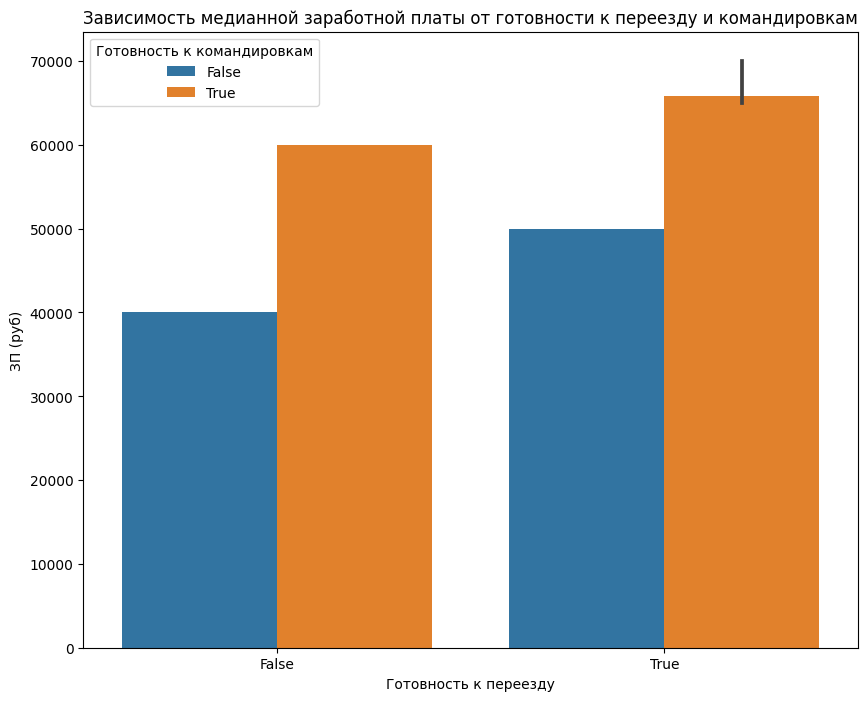

In [117]:
plt.figure(figsize=(10,8))
sns.barplot(x="Готовность к переезду", y="ЗП (руб)", hue="Готовность к командировкам", data=hh_data, estimator=np.median)
plt.title('Зависимость медианной заработной платы от готовности к переезду и командировкам')
plt.show()


На графике представлены медианные значения заработной платы для разных категорий готовности к переезду и командировкам. По оси X отложены категории готовности к переезду, по оси Y — заработная плата, а разные цвета соответствуют разным категориям готовности к командировкам.

Анализируя график, можно сделать следующие выводы:

Самый высокий уровень заработной платы наблюдается в категории "Готов к переезду" и "Готов к командировкам".
В категории "Не готов к переезду" наиболее высокая заработная плата у соискателей, которые готовы к командировкам.
В категории "Готов к переезду" заработная плата значительно выше, чем в категории "Не готов к переезду".
Наименьшая медианная заработная плата у соискателей, которые не готовы к переезду и командировкам.
Признаки "Готовность к переезду" и "Готовность к командировкам" могут влиять на уровень заработной платы, поэтому их следует учитывать при прогнозировании заработной платы.

7. Постройте сводную таблицу, иллюстрирующую зависимость **медианной** желаемой заработной платы от возраста (**"Возраст"**) и образования (**"Образование"**). На полученной сводной таблице постройте **тепловую карту**. Проанализируйте тепловую карту, сравнив показатели внутри групп.

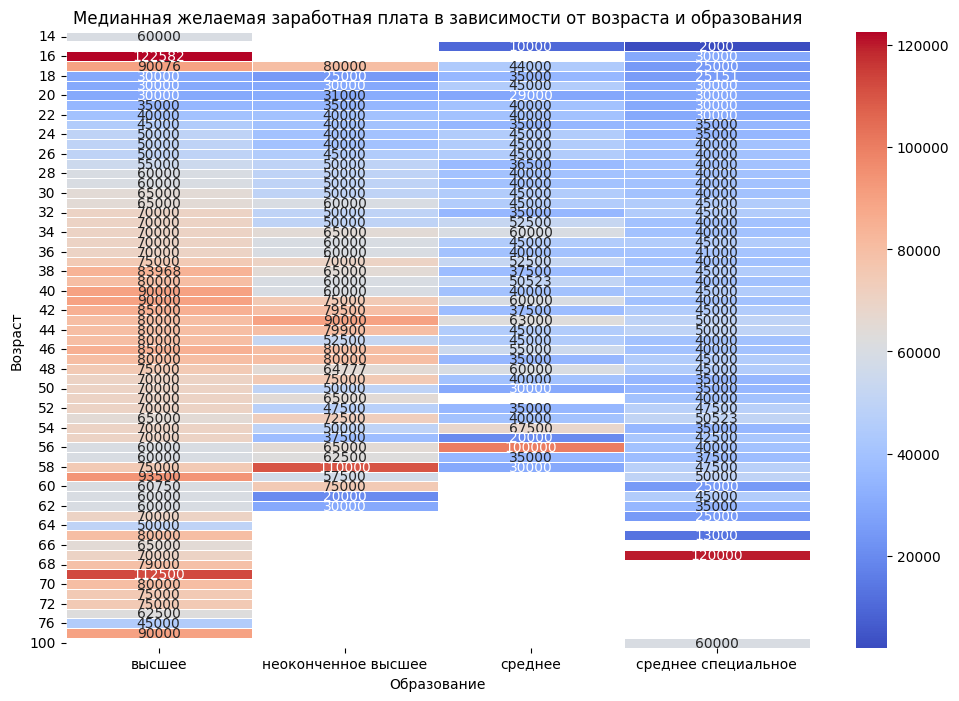

In [118]:
# создаем сводную таблицу
pivot_table = pd.pivot_table(hh_data, values='ЗП (руб)', index='Возраст', columns='Образование', aggfunc='median')

# строим тепловую карту
plt.figure(figsize=(12,8))
sns.heatmap(pivot_table, annot=True, fmt=".0f", cmap='coolwarm', linewidths=.5)
plt.title('Медианная желаемая заработная плата в зависимости от возраста и образования')
plt.show()

В среднем у людей с высшим и неполным высшим образованием к 38-45 годам формируются высокие ожидания о зарплате. У людей со средним и средним специальным образованием тоже наблюдается некоторое повышение зарплат в аналогичном возрасте, но оно менее значительное и в дальнейшем с возрастом ситуация в этой социальной группе только ухудшается, в то время как люди с высшим образованием могут надеяться на относительно высокий доход на протяжении долгого времени. 


8. Постройте **диаграмму рассеяния**, показывающую зависимость опыта работы (**"Опыт работы (месяц)"**) от возраста (**"Возраст"**). Опыт работы переведите из месяцев в года, чтобы признаки были в едином масштабе. Постройте на графике дополнительно прямую, проходящую через точки (0, 0) и (100, 100). Данная прямая соответствует значениям, когда опыт работы равен возрасту человека. Точки, лежащие на этой прямой и выше нее - аномалии в наших данных (опыт работы больше либо равен возрасту соискателя)

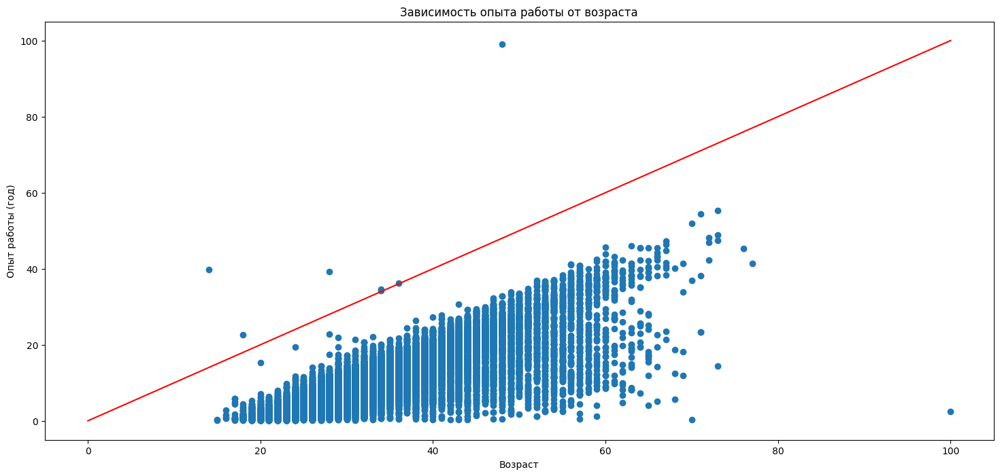

In [119]:
# переводим опыт работы из месяцев в года
hh_data['Опыт работы (год)'] = hh_data['Опыт работы (месяц)'] / 12

# создаем фигуру и оси
fig, ax = plt.subplots(figsize=(18, 8))

# добавляем точки на диаграмму
ax.scatter(hh_data['Возраст'], hh_data['Опыт работы (год)'])

# добавляем прямую
ax.plot([0, 100], [0, 100], color='red')

# добавляем подписи к осям
ax.set_xlabel('Возраст')
ax.set_ylabel('Опыт работы (год)')

# добавляем заголовок графика
ax.set_title('Зависимость опыта работы от возраста')

# выводим график на экран
plt.show()


Диаграмма рассеивания показывает прямую зависимость опыта работы от возраста. . Наличие аномалий также подтверждено наличием точек, лежащих на прямой, проходящей через точки (0,0) и (100,100), что соответствует случаям, когда опыт работы равен возрасту человека или даже превышает его. Данные аномалии могут указывать на ошибки в данных или на необычные ситуации, например, на наличие людей с опытом работы в другой сфере, переходящих в новую с возрастом. В целом, график показывает, что возраст и опыт работы являются связанными показателями, и для прогнозирования опыта работы можно учитывать возраст соискателя.

In [120]:
# Создание дополнительного столбца в датафрейме, содержащего информацию о том, лежит ли точка выше прямой
hh_data['Выше_прямой'] = (hh_data['Опыт работы (год)'] > hh_data['Возраст'])

# Отфильтровать только те точки, которые лежат выше прямой, и посчитать их количество
num_points_above_line = len(hh_data[hh_data['Выше_прямой']])
print("Количество точек, лежащих выше прямой:", num_points_above_line)


Количество точек, лежащих выше прямой: 7


# Очистка данных

1. Начнем с дубликатов в наших данных. Найдите **полные дубликаты** в таблице с резюме и удалите их. 

In [121]:
# подсчет количества полных дубликатов
num_duplicates = hh_data.duplicated().sum()

# вывод результата
print(f'Количество полных дубликатов: {num_duplicates}')

hh_data.drop_duplicates(inplace=True)


Количество полных дубликатов: 161


2. Займемся пропусками. Выведите информацию **о числе пропусков** в столбцах. 

In [122]:
print(hh_data.isnull().sum())


Ищет работу на должность:            0
Последнее/нынешнее место работы      1
Последняя/нынешняя должность         2
Обновление резюме                    0
Авто                                 0
Образование                          0
Пол                                  0
Возраст                              0
Опыт работы (месяц)                168
Город                                0
Готовность к переезду                0
Готовность к командировкам           0
полная занятость                     0
частичная занятость                  0
проектная работа                     0
волонтерство                         0
стажировка                           0
полный день                          0
сменный график                       0
гибкий график                        0
удалённая работа                     0
вахтовый метод                       0
ЗП (руб)                             0
Опыт работы (год)                  168
Выше_прямой                          0
dtype: int64


3. Итак, у нас есть пропуски в 3ех столбцах: **"Опыт работы (месяц)"**, **"Последнее/нынешнее место работы"**, **"Последняя/нынешняя должность"**. Поступим следующим образом: удалите строки, где есть пропуск в столбцах с местом работы и должностью. Пропуски в столбце с опытом работы заполните **медианным** значением.

In [123]:
# Удаляем строки с пропусками в столбцах с местом работы и должностью
hh_data = hh_data.dropna(subset=['Последнее/нынешнее место работы', 'Последняя/нынешняя должность'])

# Заполняем пропуски в столбце с опытом работы медианным значением
median_experience = hh_data['Опыт работы (месяц)'].median()
hh_data['Опыт работы (месяц)'].fillna(median_experience, inplace=True)

# результирующее среднее значение в столбце «Опыт работы (месяц)» после заполнения пропусков
median_exp = hh_data['Опыт работы (месяц)'].mean()
print(median_exp)


114.35777573405711


4. Мы добрались до ликвидации выбросов. Сначала очистим данные вручную. Удалите резюме, в которых указана заработная плата либо выше 1 млн. рублей, либо ниже 1 тыс. рублей.

In [124]:
n_before = len(hh_data)
hh_data = hh_data.drop(hh_data[(hh_data['ЗП (руб)'] > 1000000) | (hh_data['ЗП (руб)'] < 1000)].index)
n_after = len(hh_data)
print(f"Число удаленных резюме: {n_before - n_after}")


Число удаленных резюме: 89


5. В процессе разведывательного анализа мы обнаружили резюме, в которых **опыт работы в годах превышал возраст соискателя**. Найдите такие резюме и удалите их из данных


In [125]:
n_before = len(hh_data)
# Создаем маску, которая возвращает True для всех строк, где опыт работы (в годах) превышает возраст
mask = hh_data['Опыт работы (год)'] > hh_data['Возраст']

# Удаляем строки, где mask равен True
hh_data = hh_data[~mask]
n_after = len(hh_data)
print(f"Число удаленных резюме: {n_before - n_after}")



Число удаленных резюме: 7


6. В результате анализа мы обнаружили потенциальные выбросы в признаке **"Возраст"**. Это оказались резюме людей чересчур преклонного возраста для поиска работы. Попробуйте построить распределение признака в **логарифмическом масштабе**. Добавьте к графику линии, отображающие **среднее и границы интервала метода трех сигм**. Напомним, сделать это можно с помощью метода axvline. Например, для построение линии среднего будет иметь вид:

`histplot.axvline(log_age.mean(), color='k', lw=2)`

В какую сторону асимметрично логарифмическое распределение? Напишите об этом в комментарии к графику.
Найдите выбросы с помощью метода z-отклонения и удалите их из данных, используйте логарифмический масштаб. Давайте сделаем послабление на **1 сигму** (возьмите 4 сигмы) в **правую сторону**.

Выведите таблицу с полученными выбросами и оцените, с каким возрастом соискатели попадают под категорию выбросов?

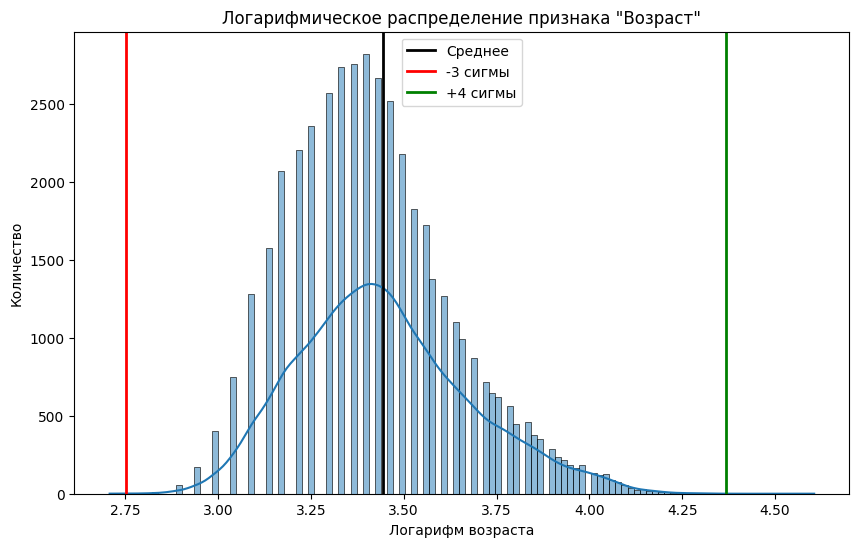

Выбросы:


,Ищет работу на должность:,Последнее/нынешнее место работы,Последняя/нынешняя должность,Обновление резюме,Авто,Образование,Пол,Возраст,Опыт работы (месяц),Город,...,волонтерство,стажировка,полный день,сменный график,гибкий график,удалённая работа,вахтовый метод,ЗП (руб),Опыт работы (год),Выше_прямой
31137,Менеджер по работе с клиентами,"ООО ""ФёрстКэшКомпани""",Менеджер по работе с клиентами,2019-06-04,Не указано,среднее,М,15,2.0,Санкт-Петербург,...,False,False,False,True,True,False,False,10000.0,0.166667,False
32950,Тестировщик игр,OOO ЖМЫХ,Тестировщик ПО,2019-09-04,Не указано,среднее специальное,М,15,3.0,другие,...,False,False,True,False,False,False,False,2000.0,0.250000,False
33654,Frontend-разработчик,Freelance,Frontend-разработчик,2019-04-19,Не указано,среднее специальное,М,100,30.0,Санкт-Петербург,...,False,True,True,False,True,False,False,60000.0,2.500000,False


Число удаленных резюме: 3


In [126]:
n_before = len(hh_data)

# Преобразование возраста в логарифмический масштаб
log_age = np.log(hh_data['Возраст'])

# Определение границ выбросов
lower_bound = log_age.mean() - 3 * log_age.std()
upper_bound = log_age.mean() + 4 * log_age.std()

# Построение графика
plt.figure(figsize=(10, 6))
histplot = sns.histplot(log_age, kde=True)
histplot.set(title='Логарифмическое распределение признака "Возраст"',
             xlabel='Логарифм возраста', ylabel='Количество')

# Добавление линий среднего и границ интервала метода трех сигм
histplot.axvline(log_age.mean(), color='k', lw=2, label='Среднее')
histplot.axvline(lower_bound, color='r', lw=2, label='-3 сигмы')
histplot.axvline(upper_bound, color='g', lw=2, label='+4 сигмы')

plt.legend()
plt.show()

# Расчет z-отклонения
z_scores = (log_age - log_age.mean()) / log_age.std()

# Находим выбросы
outliers = hh_data[(log_age < lower_bound) | (log_age > upper_bound)]

print("Выбросы:")
display(outliers)

# Удаление выбросов
hh_data = hh_data[(log_age >= lower_bound) & (log_age <= upper_bound)]

n_after = len(hh_data)
print(f"Число удаленных резюме: {n_before - n_after}")


График слегка асимметричен в левую сторону.

На основе трёх выборосов сложно сказать с каким возрастом соискатели попадают под категорию выбросов, но в данном случае мы видим двух 15-летних юношей, которые вполне могут быть реальными, т.к. имеют небольшой опыт и малые зарплатные ожидания, но вряд ли один из них успел получить среднее специальное образование.